In [1]:
import scanpy as sc
import scarches as sca
import numpy as np

Global seed set to 0


In [2]:
sc.set_figure_params(vector_friendly=True)
sc.set_figure_params(figsize=(6,6))

In [3]:
import matplotlib.pyplot as plt
import matplotlib
plt.rcParams["axes.grid"] = False
plt.rcParams["figure.dpi"] = 140
font = {'family' : 'Arial',
        'size'   : 14}

matplotlib.rc('font', **font)
matplotlib.rc('ytick', labelsize=14)
matplotlib.rc('xtick', labelsize=14)

In [4]:
adata = sc.read('kang_pbmc_integrated.h5ad')

In [5]:
adata.obs['condition_merged'] = adata.obs['condition'].tolist()
adata.obs['condition_merged'][adata.obs['condition_merged'].astype(str)=='nan'] = 'control'
adata.strings_to_categoricals()

<ipython-input-5-dcc145970c64>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs['condition_merged'][adata.obs['condition_merged'].astype(str)=='nan'] = 'control'
... storing 'condition_merged' as categorical


In [6]:
intr_cvae = sca.models.TRVAE.load('q_intr_cvae_nolog_alpha_kl_0_5_0_1_sd_2020', adata)


INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 1972 256 5
	Hidden Layer 1 in/out: 256 256
	Hidden Layer 2 in/out: 256 256
	Mean/Var Layer in/out: 256 282
Decoder Architecture:
	Cond layer in, ext, ext_m, cond, out and :  282 0 0 5 1972
	with hard mask.


In [7]:
adata.uns['active_terms'] = adata.uns['full_terms'][intr_cvae.model.decoder.nonzero_terms()]

In [8]:
directions = intr_cvae._latent_directions(method="sum")

In [9]:
adata.obsm['X_cvae'] *= directions[intr_cvae.model.decoder.nonzero_terms()]

In [10]:
adata_ctrl = adata[adata.obs.condition_merged == 'control'].copy()

In [18]:
scores_ct = intr_cvae.latent_enrich('cell_type_joint', directions=directions, n_perm=12000, exact=True, adata=adata_ctrl)

CD16+ Monocytes


<ipython-input-19-751721406f7f>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs[ct][adata.obs.cell_type_joint != ct] = np.nan
... storing 'CD16+ Monocytes' as categorical


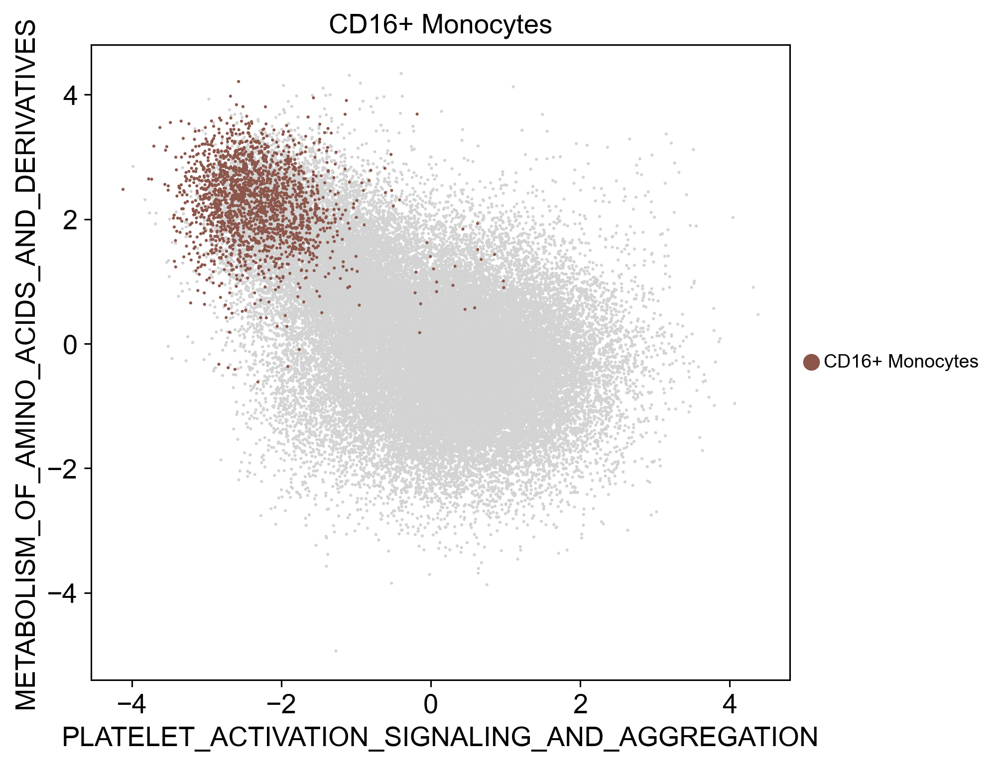

CD4+ T cells


... storing 'CD4+ T cells' as categorical


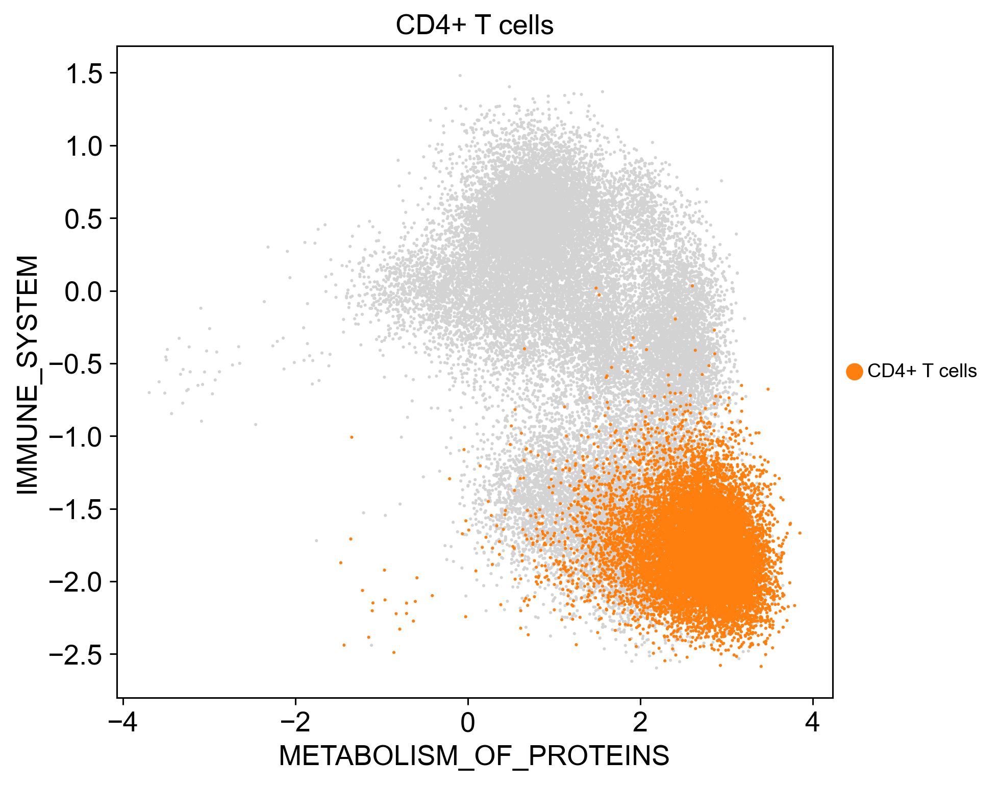

CD14+ Monocytes


... storing 'CD14+ Monocytes' as categorical


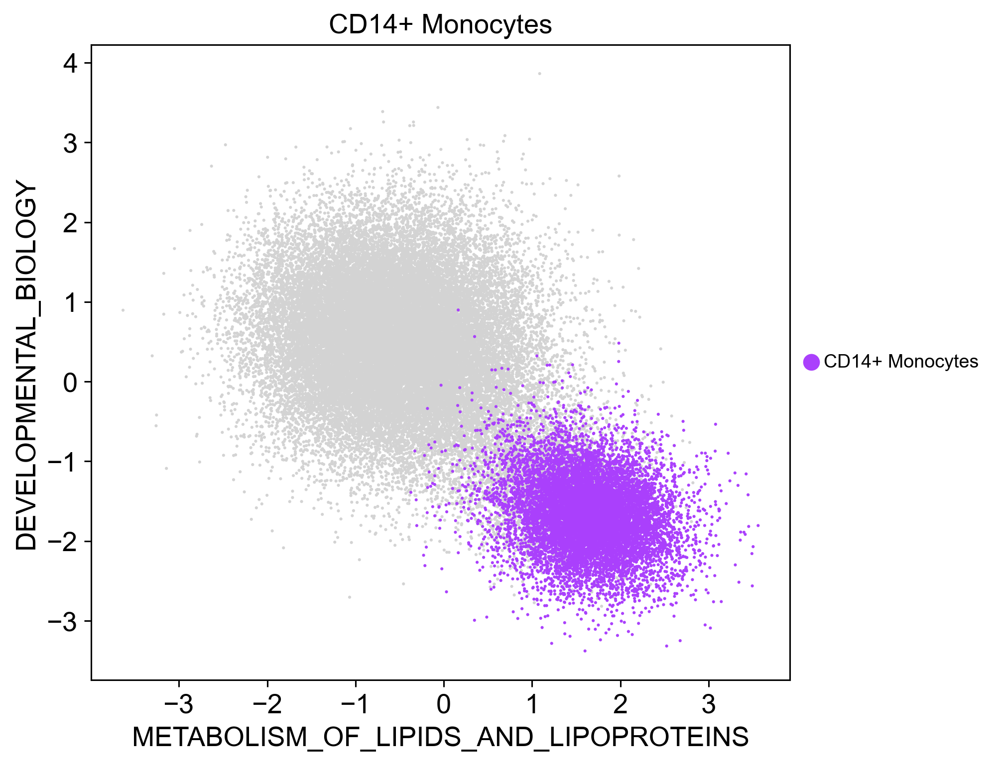

NKT cells


... storing 'NKT cells' as categorical


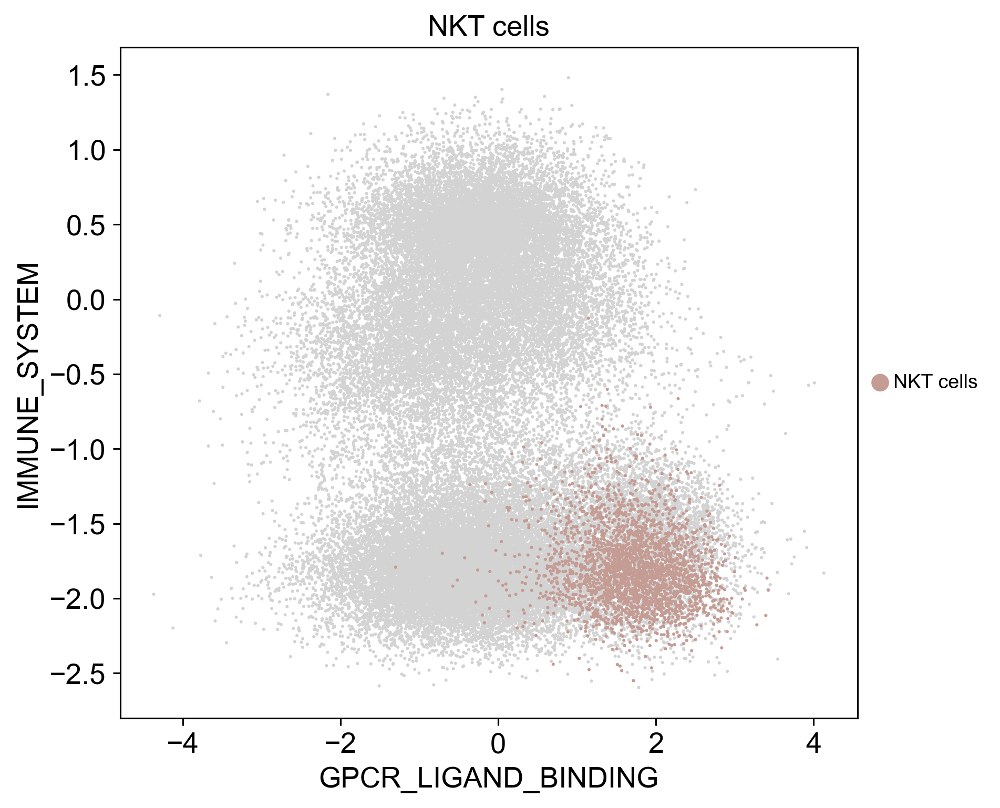

HSPCs


... storing 'HSPCs' as categorical


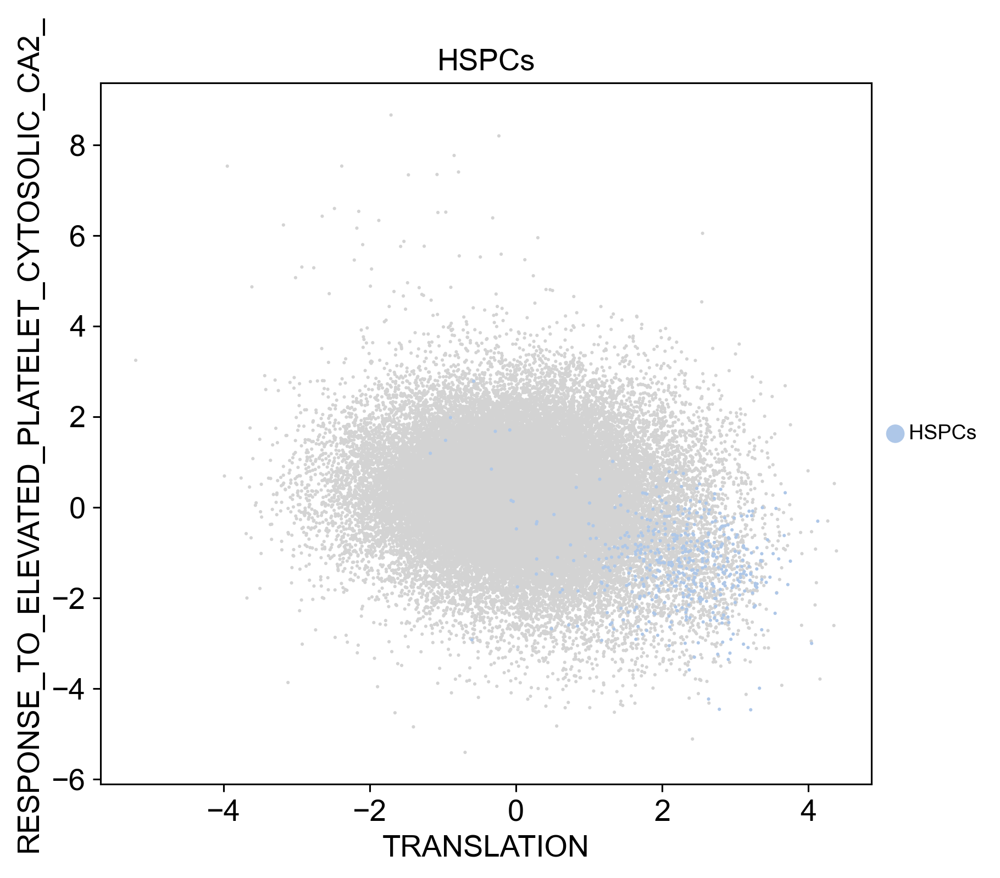

CD8+ T cells


... storing 'CD8+ T cells' as categorical


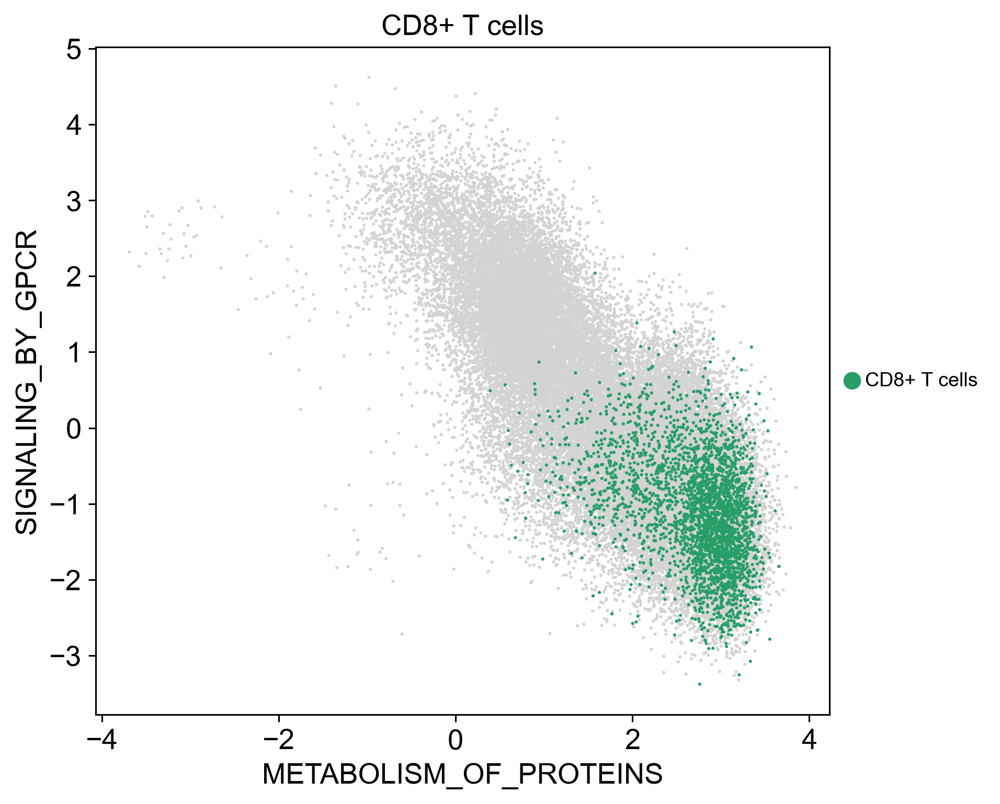

Erythrocytes


... storing 'Erythrocytes' as categorical


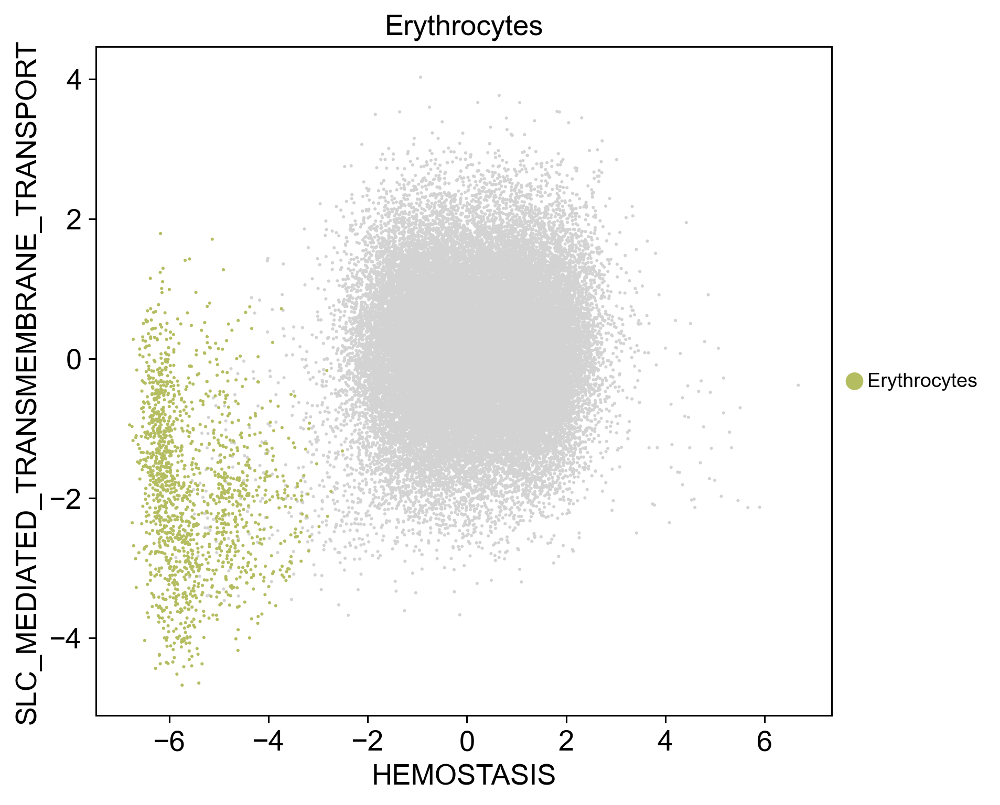

CD10+ B cells


... storing 'CD10+ B cells' as categorical


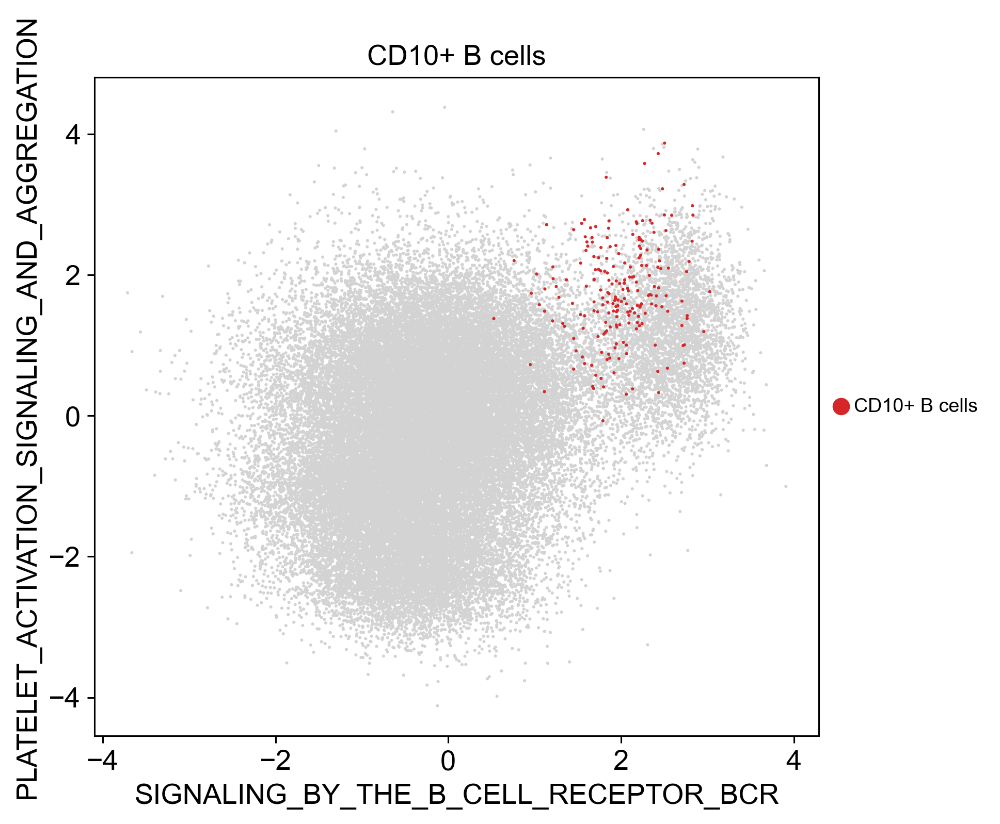

Plasmacytoid dendritic cells


... storing 'Plasmacytoid dendritic cells' as categorical


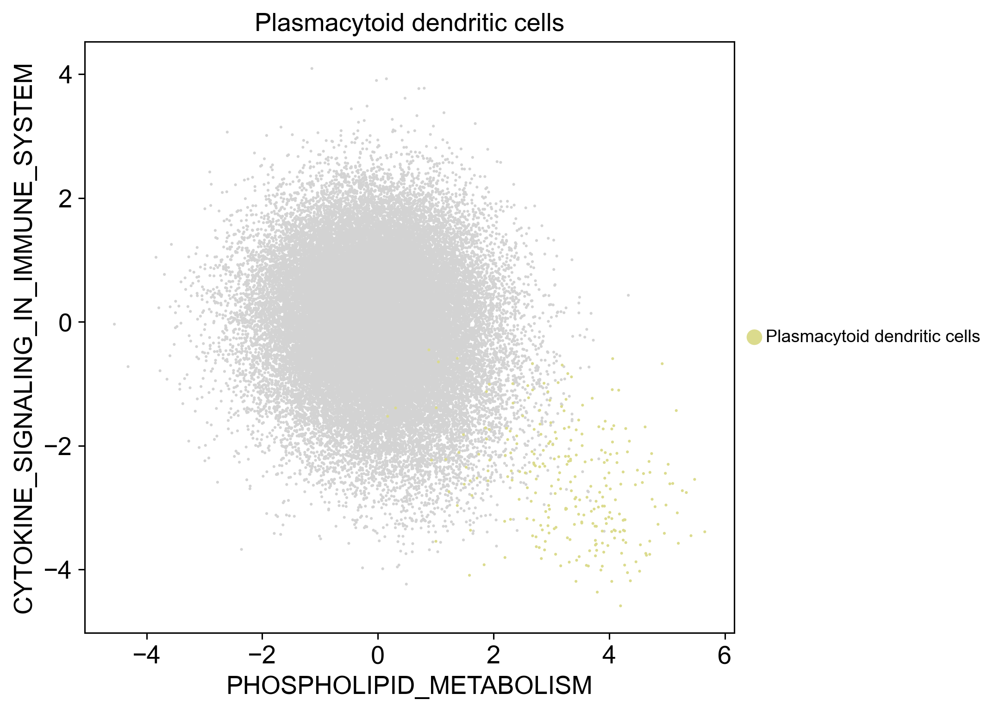

Monocyte progenitors


... storing 'Monocyte progenitors' as categorical


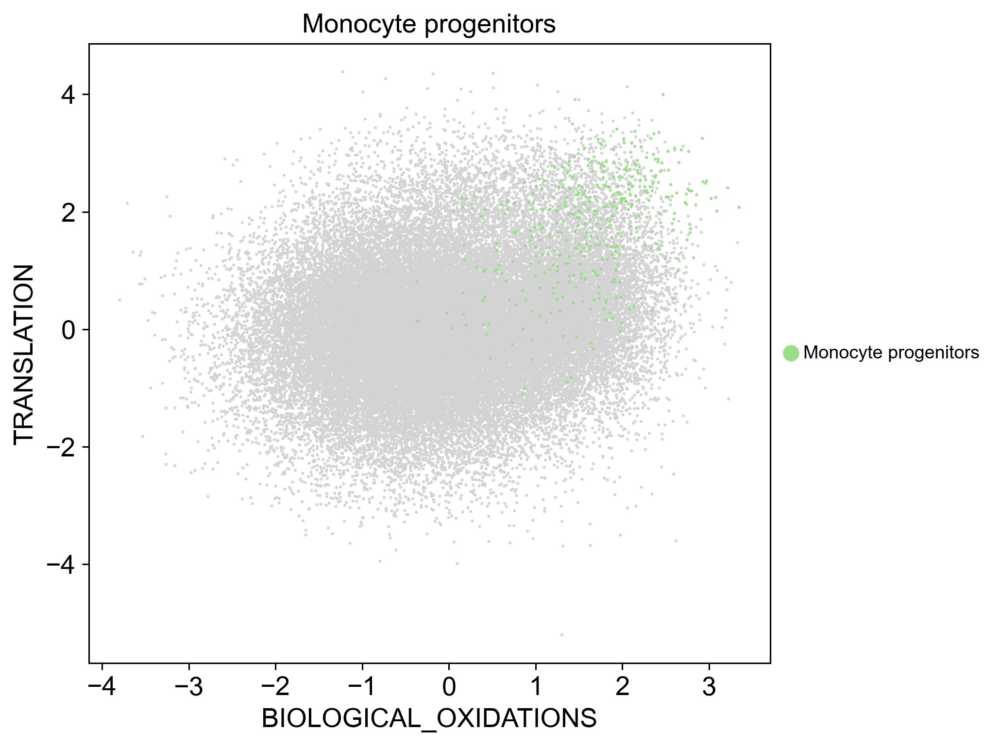

B


... storing 'B' as categorical


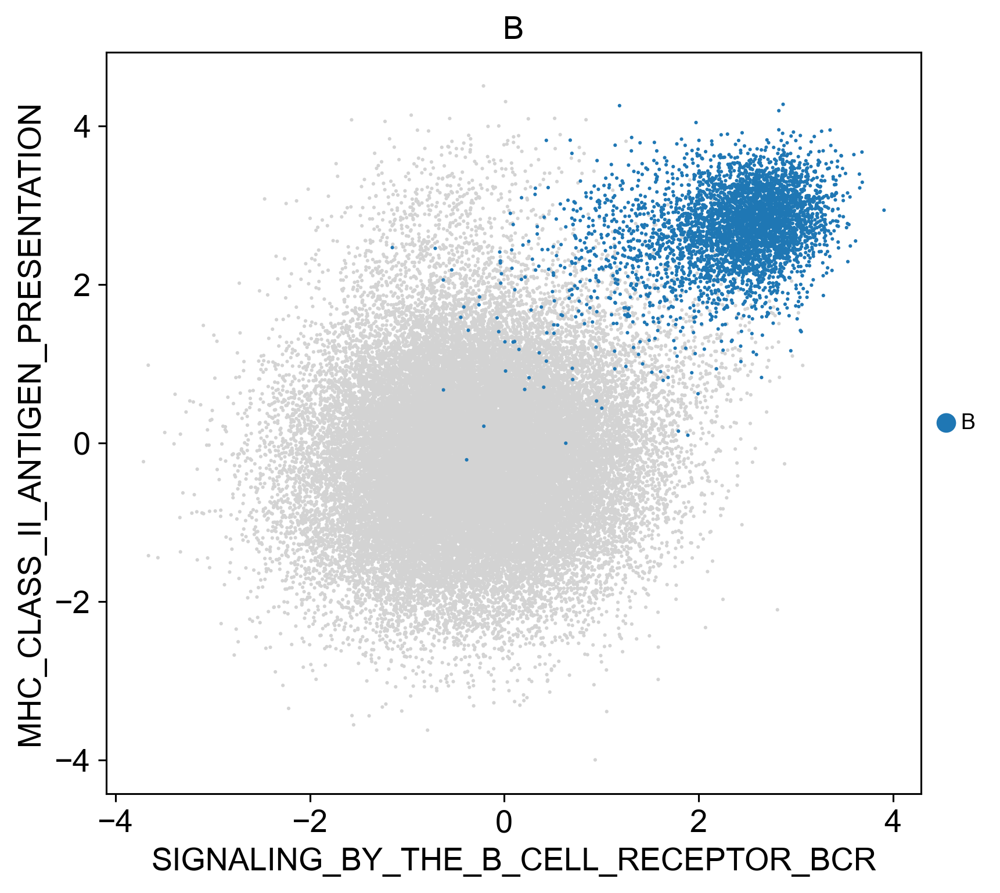

Monocyte-derived dendritic cells


... storing 'Monocyte-derived dendritic cells' as categorical


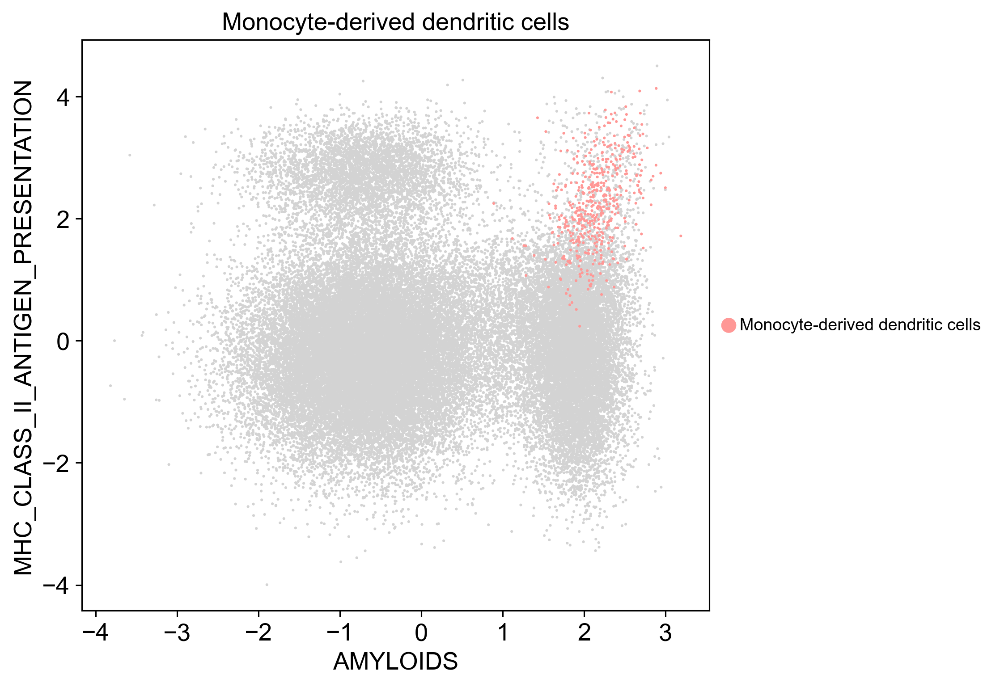

Plasma cells


... storing 'Plasma cells' as categorical


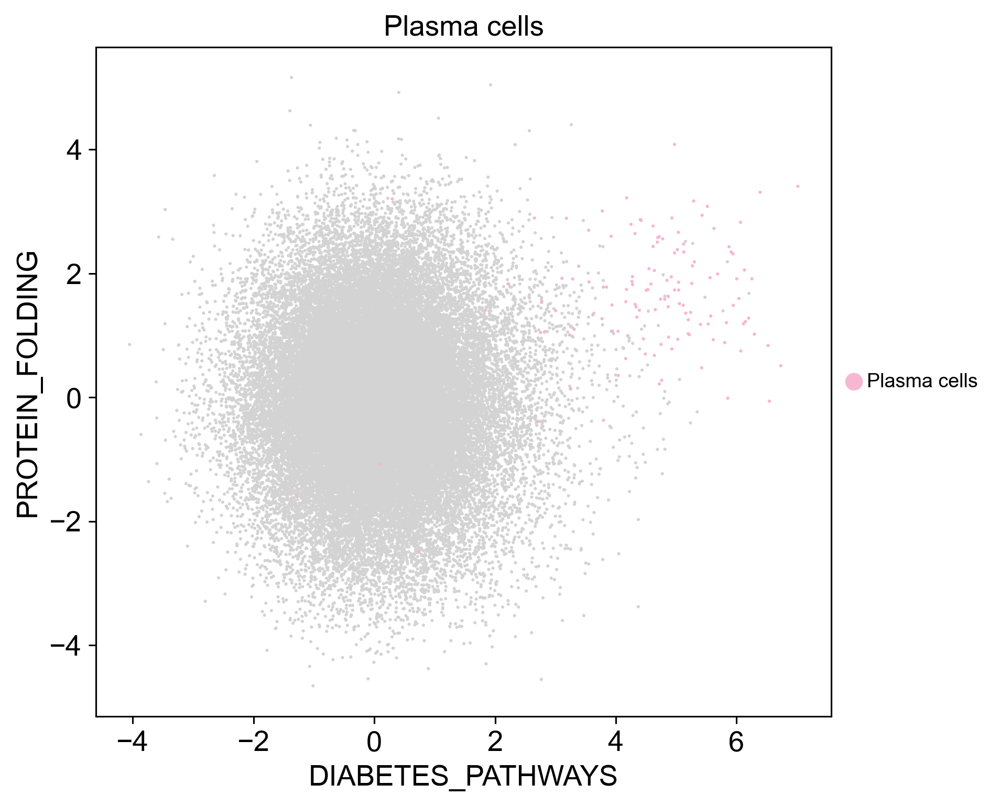

Erythroid progenitors


... storing 'Erythroid progenitors' as categorical


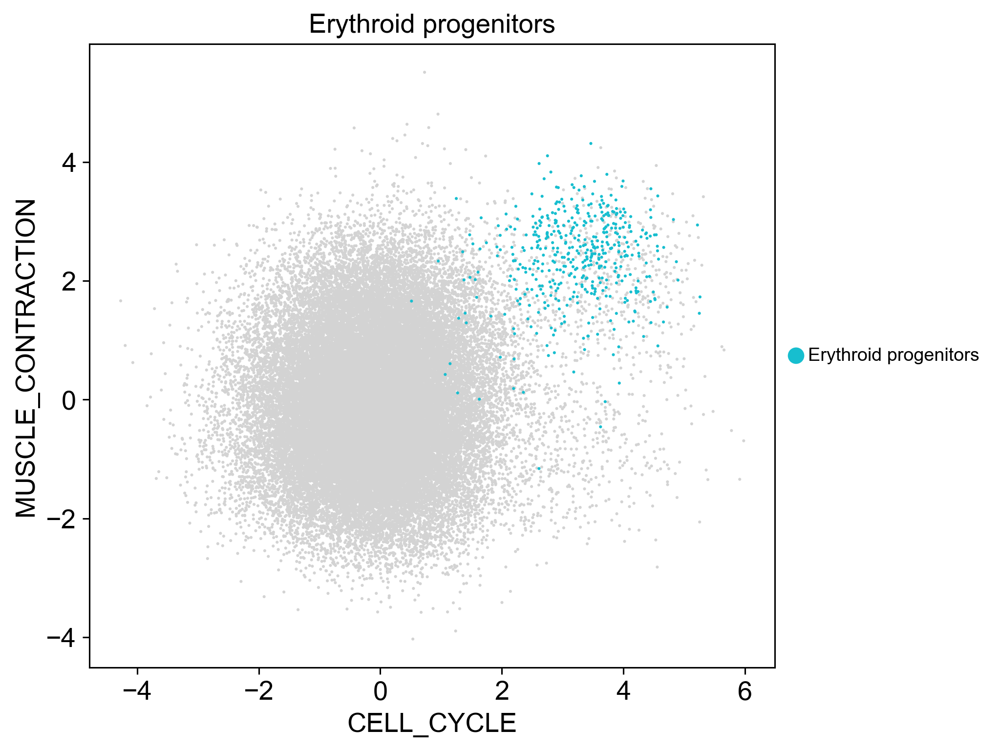

Megakaryocyte progenitors


... storing 'Megakaryocyte progenitors' as categorical


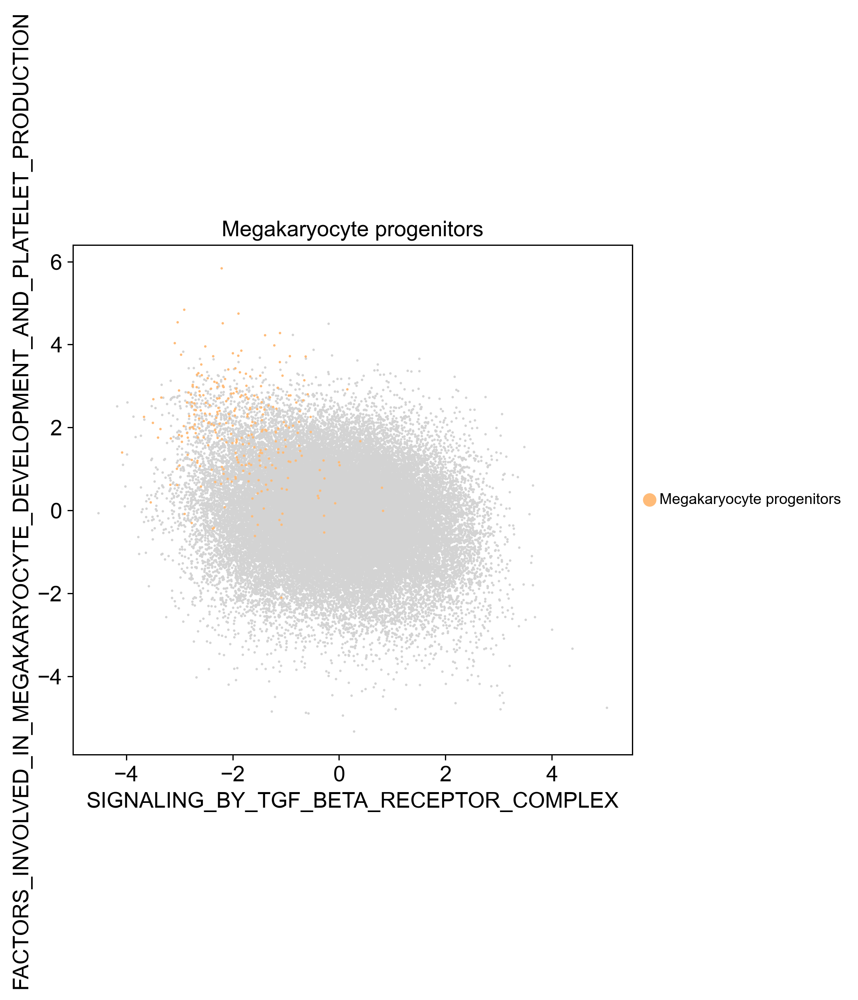

NK cells


... storing 'NK cells' as categorical


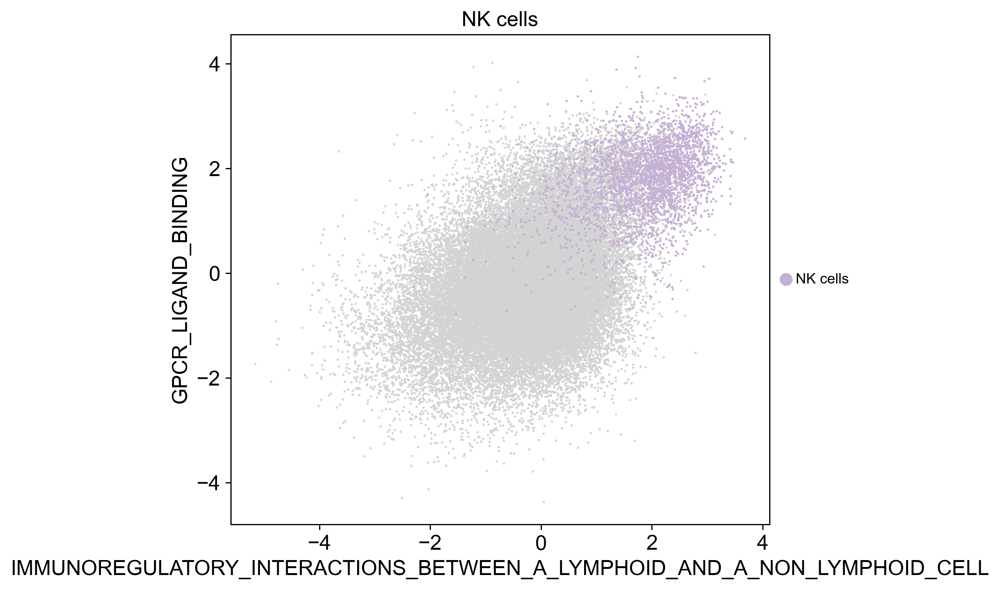

T


... storing 'T' as categorical


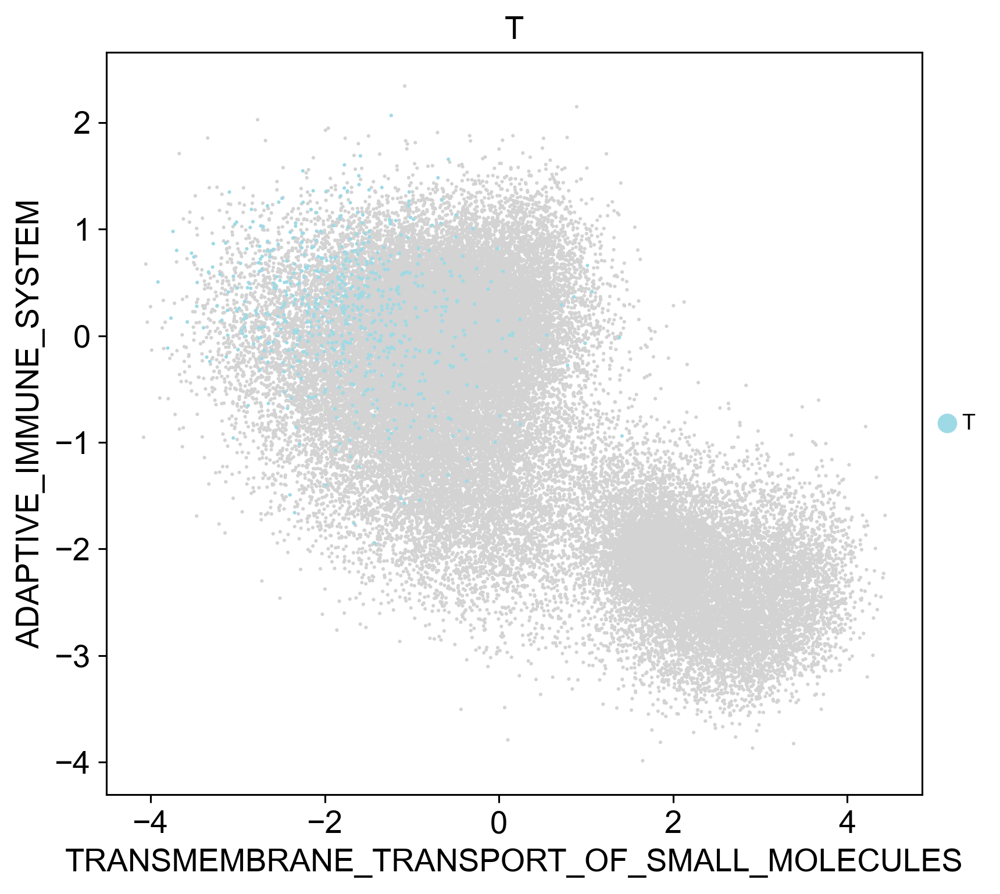

DC


... storing 'DC' as categorical


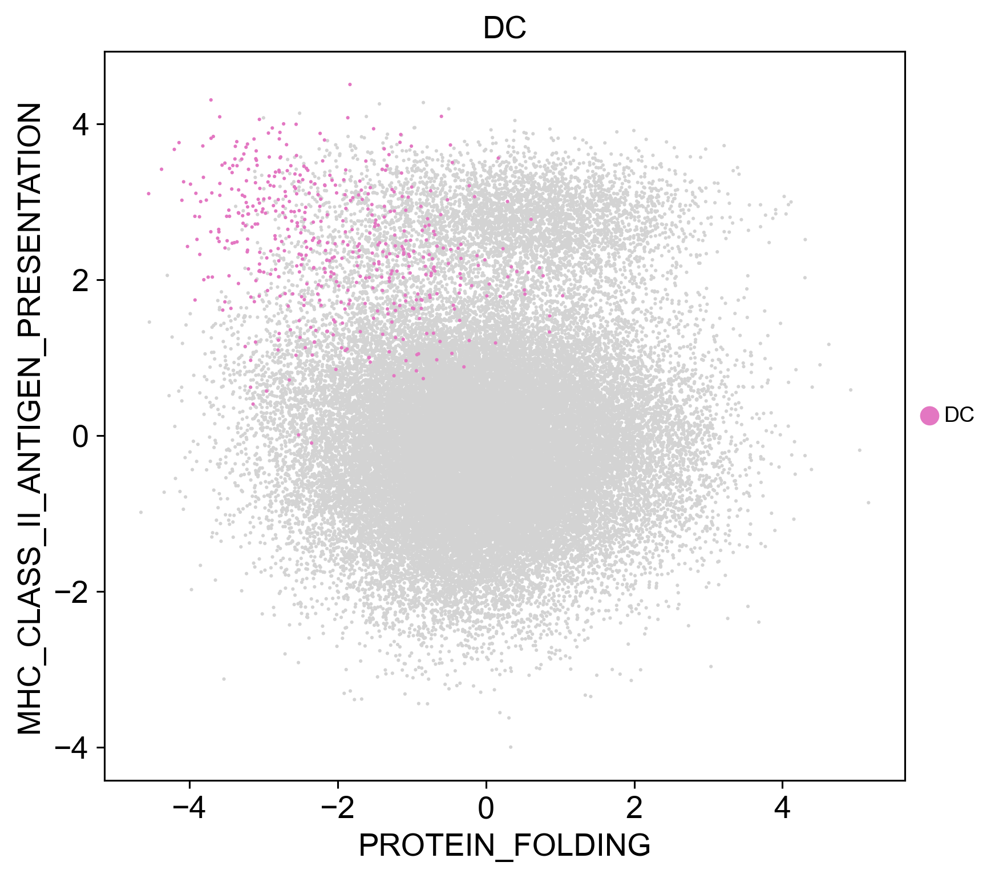

In [19]:
for ct in scores_ct:
    print(ct)
    scores = scores_ct[ct]['bf']
    sort = np.argsort(np.abs(scores))[::-1]
    top_2_terms = adata.uns['full_terms'][sort][:2]
    adata.obs[top_2_terms[0]] = adata.obsm['X_cvae'][:, adata.uns['active_terms'] == top_2_terms[0]]
    adata.obs[top_2_terms[1]] = adata.obsm['X_cvae'][:, adata.uns['active_terms'] == top_2_terms[1]]
    adata.obs[ct] = adata.obs.cell_type_joint.tolist()
    adata.obs[ct][adata.obs.cell_type_joint != ct] = np.nan
    
    clr = adata.uns['cell_type_joint_colors'][adata.obs.cell_type_joint.cat.categories == ct]
    sc.pl.scatter(adata, x=top_2_terms[0], y=top_2_terms[1], color=ct, palette=clr, size=10,
                  legend_fontsize='x-small')

In [57]:
adata[adata.obs.study=='Kang'].obs.cell_type_joint.unique().tolist()

['CD14+ Monocytes',
 'CD4+ T cells',
 'T',
 'CD8+ T cells',
 'B',
 'DC',
 'CD16+ Monocytes',
 'NK cells']

In [56]:
adata[adata.obs.study!='Kang'].obs.cell_type_joint.unique().tolist()

['CD16+ Monocytes',
 'CD4+ T cells',
 'CD14+ Monocytes',
 'NKT cells',
 'HSPCs',
 'CD8+ T cells',
 'Erythrocytes',
 'CD10+ B cells',
 'Plasmacytoid dendritic cells',
 'Monocyte progenitors',
 'B',
 'Monocyte-derived dendritic cells',
 'Plasma cells',
 'Erythroid progenitors',
 'Megakaryocyte progenitors',
 'NK cells']